# Python script for Bandwidth Extension of audio data.
> 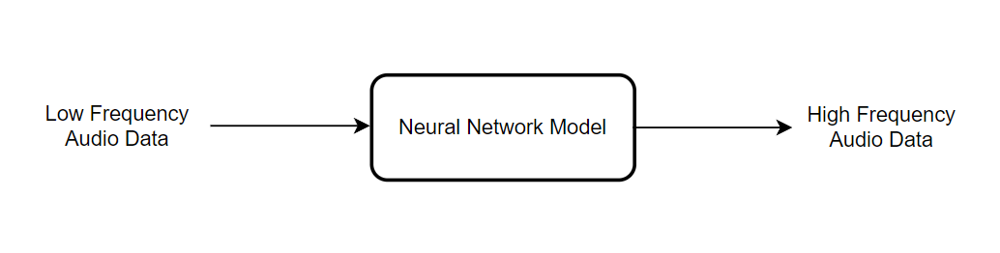

# You can make a local copy of this repo to your local drive for local changes. 
1. In "File" dropdown click on "Save a copy in Drive"

In [ ]:
# Mounting the google drive and change the directory
from google.colab import drive
drive.mount('/content/drive')
%cd drive/MyDrive

Mounted at /content/drive
/content/drive/MyDrive


# Change Runtime from CPU to GPU
1. "Runtime" > Change runtime type > GPU(From dropdown)

# 1. Clone the Repo 

In [ ]:
! git clone https://github.com/mukul74/BandwidthExtension.git
%cd /content/drive/MyDrive/BandwidthExtension/Code/
print("CURRENT WORKING DIRECTORY : ")
!pwd
print("Folders available in the project : ")
!ls

Cloning into 'BandwidthExtension'...
remote: Enumerating objects: 249, done.
remote: Counting objects: 100% (249/249), done.
remote: Compressing objects: 100% (189/189), done.
remote: Total 249 (delta 51), reused 243 (delta 45), pack-reused 0
Receiving objects: 100% (249/249), 24.87 MiB | 15.13 MiB/s, done.
Resolving deltas: 100% (51/51), done.
/content/drive/MyDrive/BandwidthExtension/Code
CURRENT WORKING DIRECTORY : 
/content/drive/MyDrive/BandwidthExtension/Code
Folders available in the project : 
dataset.py	     logdir	      runs
default_config.json  models	      test_data_male
generated	     __pycache__      test_data_male_target
inference_engine.py  requirement.txt  utils.py


# 2. Libraries to be installed

In [ ]:
!pip install -r requirement.txt
!pip install librosa
!pip install wget

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 126 kB 7.0 MB/s 
     |████████████████████████████████| 18.5 MB 1.1 MB/s 
     |████████████████████████████████| 98.3 MB 24 kB/s 
     |████████████████████████████████| 149 kB 72.3 MB/s 
     |████████████████████████████████| 97 kB 7.6 MB/s 
     |████████████████████████████████| 4.6 MB 54.3 MB/s 
     |████████████████████████████████| 86 kB 7.3 MB/s 
     |████████████████████████████████| 63 kB 2.0 MB/s 
     |████████████████████████████████| 180 kB 71.5 MB/s 
     |████████████████████████████████| 155 kB 75.6 MB/s 
     |████████████████████████████████| 4.1 MB 42.9 MB/s 
     |████████████████████████████████| 122 kB 76.0 MB/s 
     |████████████████████████████████| 786 kB 70.8 MB/s 
     |████████████████████████████████| 1.4 MB 59.0 MB/s 
     |████████████████████████████████| 133 kB 73.2 MB/s 
     |████████████████████████████████|

# 3. Create the folder for storing the generated audio and input audio from user  

In [ ]:
! mkdir test_data_custom   # Input audio files will be stored here
! mkdir test_data_custom_target   # Target audio files will be stored here, for comprision

# 4. Importing the important Libraries

In [ ]:
import os
import librosa
import glob
import soundfile as sf
import scipy.signal as signal
import matplotlib.pyplot as plt
import numpy as np
import wget
import bokeh.io
bokeh.io.output_notebook()
import bokeh.plotting
from bokeh.palettes import Spectral11
#from bokeh.models import HoverTool
from bokeh.plotting import figure
import IPython.display as ipd
from bokeh.io import export_png
from IPython.display import display

/usr/local/lib/python3.7/dist-packages/resampy/interpn.py:114: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  _resample_loop_p(x, t_out, interp_win, interp_delta, num_table, scale, y)


# 5.1 Add your audio file, which needs to be upsampled. 
    1. Click on session to storage, located below **Files** or having a small upward arrow symbol

In [ ]:
%cp /content/*.wav /content/drive/MyDrive/BandwidthExtension/Code/test_data_custom/
%cd /content/drive/MyDrive/BandwidthExtension/Code/test_data_custom/
!ls
files = os.listdir("/content/drive/MyDrive/BandwidthExtension/Code/test_data_custom/")
for filename in glob.glob(os.path.join("/content/drive/MyDrive/BandwidthExtension/Code/test_data_custom/", '*.wav')):
    data, samplerate = librosa.load(filename, sr=16000,mono=True, duration=8.0)
    print("Wav files : ",filename)
    sf.write(filename, data, samplerate=16000)

/content/drive/MyDrive/BandwidthExtension/Code/test_data_custom
mixture_mono_16000_8sec_male.wav
Wav files :  /content/drive/MyDrive/BandwidthExtension/Code/test_data_custom/mixture_mono_16000_8sec_male.wav


In [ ]:
# Delete the input file from temp memory
%cd /content/
%rm *.wav

/content


# 5.2 Add your target audio file for comparision

In [ ]:
%cp /content/*.wav /content/drive/MyDrive/BandwidthExtension/Code/test_data_custom_target/
%cd /content/drive/MyDrive/BandwidthExtension/Code/test_data_custom_target/
!ls
files = os.listdir("/content/drive/MyDrive/BandwidthExtension/Code/test_data_custom_target/")
for filename in glob.glob(os.path.join("/content/drive/MyDrive/BandwidthExtension/Code/test_data_custom_target/", '*.wav')):
    data, samplerate = librosa.load(filename, sr=32000,mono=True, duration=8.0)
    print("Wav files : ",filename)
    sf.write(filename, data, samplerate=32000)

/content/drive/MyDrive/BandwidthExtension/Code/test_data_custom_target
mixture_mono_32000_8sec_male.wav
Wav files :  /content/drive/MyDrive/BandwidthExtension/Code/test_data_custom_target/mixture_mono_32000_8sec_male.wav


## 6. Download the pre-trained model 

In [ ]:
# !wget https://zenodo.org/record/6883120/files/Training_checkpoint.pth?download=1 -O model_file
# !cp model_file /content/drive/MyDrive/BandwidthExtension/logdir/default/pretrained_model/.

# 7. Clear the audio files from the content folder and generated checkpoints for the .ipynb file

In [ ]:
%cd /content/
!ls
%rm *.wav
!pwd
!ls
%cd /content/drive/MyDrive/BandwidthExtension/Code/
!ls
%rm -rf `find -type d -name .ipynb_checkpoints`
!pwd

/content
drive  mixture_mono_32000_8sec_male.wav  sample_data
/content
drive  sample_data
/content/drive/MyDrive/BandwidthExtension/Code
dataset.py	     models	       test_data_custom_target
default_config.json  __pycache__       test_data_male
generated	     requirement.txt   test_data_male_target
inference_engine.py  runs	       utils.py
logdir		     test_data_custom
/content/drive/MyDrive/BandwidthExtension/Code


 # 8.  Details about the arguments for inference and running the inference
    --input_data_dir      : input audio files(all audio files should be of same time duration)
    --num_epochs          : Not used while inference
    --batch_size          : Not used while inference 
    --resume              : Should be (True) for Inference
    --max-checkpoints     : Not used while inference
    --checkpoint_every    : Not used while inference
    --sample_rate         : 16000 (Input audio sampling rate)
    --device              : Cuda(Default)
    --training            : Should be (False) for Inference
    --target_sample_rate  : 32000 (Target audio sampling rate)
    --audio_duration      : 8 sec (Default)

In [ ]:
!python inference_engine.py --input_data_dir ./test_data_custom --num_epochs 500 --batch_size 32 --resume True --max_checkpoints 1 --checkpoint_every 25 --sample_rate 16000 --device cuda --training False --target_sample_rate 32000 --audio_duration 8

/usr/local/lib/python3.7/dist-packages/resampy/interpn.py:114: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  _resample_loop_p(x, t_out, interp_win, interp_delta, num_table, scale, y)
Folder exist
Device Available :  cuda
Device selected for Training/Inference :  cuda
Model is in inference mode now
Loading the configurations for the model from the json file
Developing the SampleRNN Model
******************************************************************************************************************************************************
BWExtender(
  (model): Encoder(
    (mxpool): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (dconv01): Conv1d(1, 64, kernel_size=(65,), stride=(1,))
    (dconv02): Conv1d(64, 128, kernel_size=(33,), stride=(1,))
    (dconv03): Conv1d(128, 256, kernel_size=(17,), stride=(1,))
    (rnn

# 9. Generated audio files are in the genrated folder
     1. With the help of code below, we can play the original, target and generated audio file.
     2. We can can also have a look at there respective spectrograms. 

In [ ]:
%cd /content/drive/MyDrive/BandwidthExtension/Code/generated/
!ls

/content/drive/MyDrive/BandwidthExtension/Code/generated
default  Generated_Bandwidth_Extended_test_audio_1.wav


In [ ]:
from bokeh.io import export_svgs
fftlen= "2048" #@param [256,2048, 8192]
fftlen=int(fftlen)
timesoverlap= "8" #@param [2, 4, 8, 16 ] 
#This many timer are the windows overlapped
timesoverlap=int(timesoverlap)
noverlap=fftlen -fftlen//timesoverlap
files = os.listdir("/content/drive/MyDrive/BandwidthExtension/Code/generated")
for filename in glob.glob(os.path.join("/content/drive/MyDrive/BandwidthExtension/Code/generated", '*.wav')):
  x_gen, sr_gen = librosa.load(filename,sr=None)
  display(ipd.Audio(x_gen,rate=sr_gen))
  channels = 0
  siglen=len(x_gen)/sr_gen
  print("Bandwidth Extended Audio Sample with Sampling Rate of : ", sr_gen)
  freq_gen ,t_gen,y_gen = signal.stft(x_gen[:],fs=sr_gen, nperseg=fftlen, noverlap = noverlap) 
  magdb_gen=20*np.log10(np.abs(y_gen)) #Values in dB

  print("max(magdb)=",np.max(magdb_gen), "min(magdb)=", np.min(magdb_gen), "magdb.shape=",magdb_gen.shape )

  p_gen = figure(width=400, height=400,title='Spectrogram of Generated Audio', x_axis_label= 'Time (s)', y_axis_label='Frequency (Hz)',tooltips=[("time", "$x"), ("freq.:", "$y"), ("dB", "@image")])
  #.x_range.range_padding = p.y_range.range_padding = 0
  p_gen.image(image=[magdb_gen], x=0, y=0, dw=siglen, dh=sr_gen/2, palette="Spectral11", level="image")
  p_gen.grid.grid_line_width = 0.5
  # bokeh.plotting.show(p_gen)

Bandwidth Extended Audio Sample with Sampling Rate of :  32000
max(magdb)= -20.236895 min(magdb)= -212.78915 magdb.shape= (1025, 1001)


In [ ]:
fftlen= "2048" #@param [256,2048, 8192]
fftlen=int(fftlen)
timesoverlap= "8" #@param [2, 4, 8, 16 ] 
#This many timer are the windows overlapped
timesoverlap=int(timesoverlap)
noverlap=fftlen -fftlen//timesoverlap
files = os.listdir("/content/drive/MyDrive/BandwidthExtension/Code/test_data_custom_target")
for filename in glob.glob(os.path.join("/content/drive/MyDrive/BandwidthExtension/Code/test_data_custom_target", '*.wav')):
  x_tgt, sr_tgt = librosa.load(filename,sr=None)
  display(ipd.Audio(x_gen,rate=sr_tgt))
  channels = 0
  siglen=len(x_tgt)/sr_tgt
  print("Target Audio Sample with Sampling Rate of : ", sr_tgt)
  freq_tgt ,t_tgt,y_tgt = signal.stft(x_tgt[:],fs=sr_tgt, nperseg=fftlen, noverlap = noverlap) 
  magdb_tgt=20*np.log10(np.abs(y_tgt)) #Values in dB

  print("max(magdb)=",np.max(magdb_tgt), "min(magdb)=", np.min(magdb_tgt), "magdb.shape=",magdb_tgt.shape )

  p_tgt = figure(width=400, height=400,title="Spectrogram of Target Audio", x_axis_label= 'Time (s)', y_axis_label='Frequency (Hz)',tooltips=[("time", "$x"), ("freq.:", "$y"), ("dB", "@image")])
  #.x_range.range_padding = p.y_range.range_padding = 0
  p_tgt.image(image=[magdb_tgt], x=0, y=0, dw=siglen, dh=sr_tgt/2, palette="Spectral11", level="image")
  p_tgt.grid.grid_line_width = 0.5
  # bokeh.plotting.show(p_tgt)

Target Audio Sample with Sampling Rate of :  32000
max(magdb)= -20.258453 min(magdb)= -168.77277 magdb.shape= (1025, 1001)


In [ ]:
fftlen= "2048" #@param [256,2048, 8192]
fftlen=int(fftlen)
timesoverlap= "8" #@param [2, 4, 8, 16 ] 
#This many timer are the windows overlapped
timesoverlap=int(timesoverlap)
noverlap=fftlen -fftlen//timesoverlap
files = os.listdir("/content/drive/MyDrive/BandwidthExtension/Code/test_data_custom")
for filename in glob.glob(os.path.join("/content/drive/MyDrive/BandwidthExtension/Code/test_data_custom", '*.wav')):
  x_inp, sr_inp = librosa.load(filename,sr=None)
  display(ipd.Audio(x_inp,rate=sr_inp))
  channels = 0
  siglen=len(x_inp)/sr_inp
  print("Input Audio Sample with Sampling Rate of : ", sr_inp)
  freq_inp ,t_inp,y_inp = signal.stft(x_inp[:],fs=sr_inp, nperseg=fftlen, noverlap = noverlap) 
  magdb_inp=20*np.log10(np.abs(y_inp)) #Values in dB

  print("max(magdb)=",np.max(magdb_inp), "min(magdb)=", np.min(magdb_inp), "magdb.shape=",magdb_inp.shape )

  p_inp = figure(width=400, height=400,title="Spectrogram of Input Audio", x_axis_label= 'Time (s)', y_axis_label='Frequency (Hz)',tooltips=[("time", "$x"), ("freq.:", "$y"), ("dB", "@image")])
  #.x_range.range_padding = p.y_range.range_padding = 0
  p_inp.image(image=[magdb_inp], x=0, y=0, dw=siglen, dh=sr_inp/2, palette="Spectral11", level="image")
  p_inp.grid.grid_line_width = 0.5
  # bokeh.plotting.show(p_inp)

Input Audio Sample with Sampling Rate of :  16000
max(magdb)= -21.122452 min(magdb)= -144.72232 magdb.shape= (1025, 501)


In [16]:
from bokeh.io import output_file, show
from bokeh.layouts import row
show(row(p_gen, p_tgt, p_inp))